In [1]:
from yahoo_fin.stock_info import get_data
from datetime import date
import plotly.express as px
import pandas as pd
import numpy as np
from pathlib import Path
import csv
import seaborn as sns
import plotly.graph_objects as go
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import panel as pn
from panel.interact import interact
pn.extension("plotly")
%matplotlib inline


today = date.today()
spy = get_data("spy", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
xle = get_data("xle", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
xlf = get_data("xlf", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
gold = get_data("GLD", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
tlt = get_data("tlt", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
usd = get_data("dx-y.nyb", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")


In [2]:
usd.fillna(method='bfill', inplace=True)
usd.head()

,open,high,low,close,adjclose,volume,ticker
2016-01-04,98.690002,99.180000,98.050003,98.870003,98.870003,0.0,DX-Y.NYB
2016-01-05,98.870003,99.629997,98.750000,99.400002,99.400002,0.0,DX-Y.NYB
2016-01-06,99.389999,99.580002,99.110001,99.180000,99.180000,0.0,DX-Y.NYB
2016-01-07,99.220001,99.300003,98.169998,98.220001,98.220001,0.0,DX-Y.NYB
2016-01-08,98.309998,99.180000,98.269997,98.540001,98.540001,0.0,DX-Y.NYB


In [3]:
# @TODO: Set file paths for btc_data.csv and eth_data.csv
btc_filepath = Path('Resources/BTC-USD.csv')
btc_df = pd.read_csv(btc_filepath, index_col="Date", infer_datetime_format=True, parse_dates=True)

btc_df.head()


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0


In [4]:
btc_df.sort_index(inplace=True)
btc_df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0


In [5]:
eth_filepath = Path('Resources/ETH-USD.csv')
eth_df = pd.read_csv(eth_filepath, index_col="Date", infer_datetime_format=True, parse_dates=True)

eth_df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-08-07,2.831620,3.536610,2.521120,2.772120,2.772120,164329.0
2015-08-08,2.793760,2.798810,0.714725,0.753325,0.753325,674188.0
2015-08-09,0.706136,0.879810,0.629191,0.701897,0.701897,532170.0
2015-08-10,0.713989,0.729854,0.636546,0.708448,0.708448,405283.0
2015-08-11,0.708087,1.131410,0.663235,1.067860,1.067860,1463100.0


In [6]:
#fig = px.line(spy['close'], labels={ 'close' : 'SPY CLOSE'})
#fig.show()

In [7]:
#gold.head()

In [8]:
#dxy = get_data("dxy", start_date="01/03/2015", end_date=today, index_as_date = True, interval="1d")
#dxy['close'].plot(figsize=(20,10))

In [9]:
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

combined_df = pd.concat([btc_df['Close'], eth_df['Close'], spy['close'], gold['close'], tlt['close'], usd['close'], xle['close'], xlf['close'],], axis="columns", join="inner")
combined_df.columns = column
combined_df.head()

,BTC,ETH,SPY,TLT,GLD,USD,XLE,XLF
2016-01-04,433.091003,0.954480,201.020004,102.889999,121.449997,98.870003,60.299999,18.984566
2016-01-05,431.959991,0.950176,201.360001,103.180000,120.959999,99.400002,60.529999,19.057676
2016-01-06,429.105011,0.950860,198.820007,104.669998,122.589996,99.180000,58.200001,18.765232
2016-01-07,458.048004,0.942005,194.050003,106.150002,122.809998,98.220001,56.779999,18.237206
2016-01-08,453.230011,0.986789,191.919998,105.680000,123.360001,98.540001,56.049999,17.952885


In [10]:
combined_df.isnull().sum()

BTC    5
ETH    5
SPY    0
TLT    0
GLD    0
USD    0
XLE    0
XLF    0
dtype: int64

In [11]:
portfolio_returns  = combined_df.dropna()

In [12]:
portfolio_returns.isnull().sum()

BTC    0
ETH    0
SPY    0
TLT    0
GLD    0
USD    0
XLE    0
XLF    0
dtype: int64

In [13]:
portfolio_returns = portfolio_returns.pct_change()

In [14]:
portfolio_returns  = portfolio_returns.dropna()

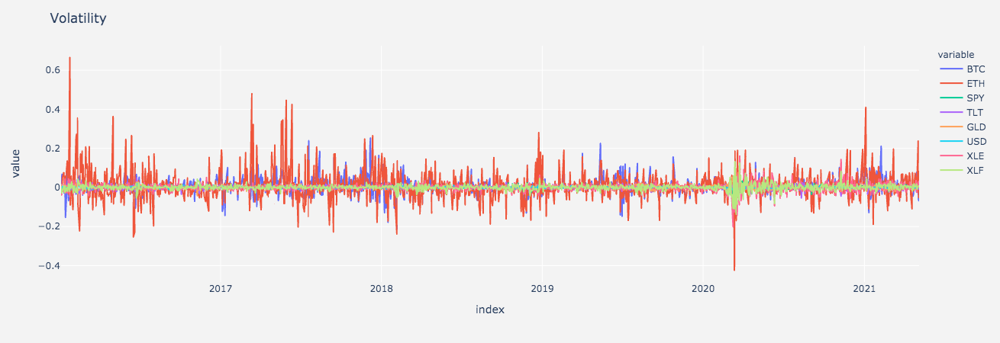

In [15]:
port_returns_fig = px.line(portfolio_returns)
port_returns_fig.update_layout(
    title='Volatility',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
port_returns_fig.show()

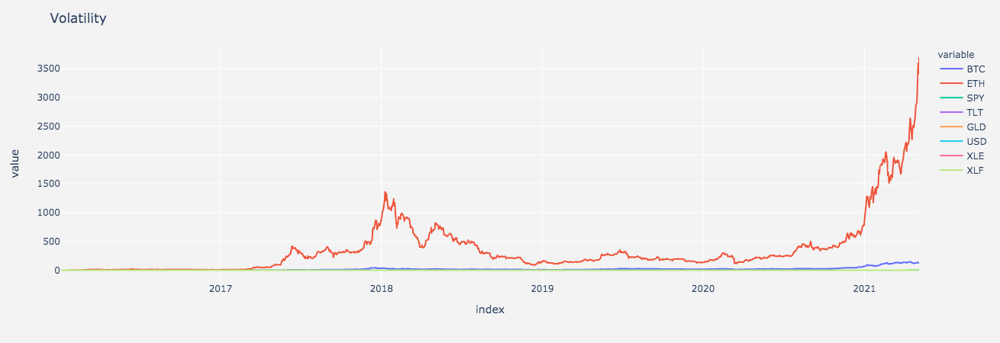

In [16]:
# Calculate cumulative returns of all portfolios
cumulative_returns = (1 + portfolio_returns).cumprod()
# Plot cumulative returns
volatility_fig = px.line(cumulative_returns)
volatility_fig.update_layout(
    title='Volatility',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
volatility_fig.show()

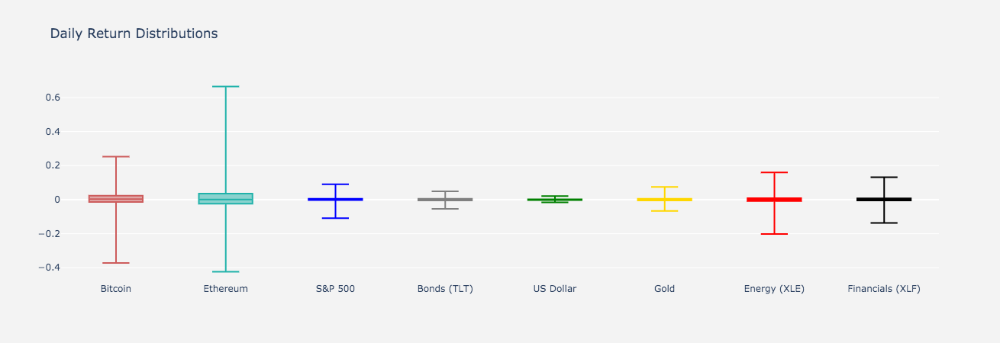

In [79]:
vol_box_fig = go.Figure()
vol_box_fig.add_trace(go.Box(y=portfolio_returns['BTC'], name='Bitcoin',
                marker_color = 'indianred', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['ETH'], name = 'Ethereum',
                marker_color = 'lightseagreen', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['SPY'], name='S&P 500',
                marker_color = 'blue', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['TLT'], name = 'Bonds (TLT)',
                marker_color = 'grey', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['USD'], name = 'US Dollar',
                marker_color = 'green', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['GLD'], name='Gold',
                marker_color = 'gold', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['XLE'], name = 'Energy (XLE)',
                marker_color = 'red', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['XLF'], name = 'Financials (XLF)',
                marker_color = 'black', boxpoints=False))

vol_box_fig.update_layout(
    title='Daily Return Distributions',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=False
)

vol_box_fig.show()

In [18]:
volatility = portfolio_returns.std()
volatility

BTC    0.047137
ETH    0.075322
SPY    0.011748
TLT    0.008836
GLD    0.008745
USD    0.003933
XLE    0.020558
XLF    0.015772
dtype: float64

In [19]:
volatility = portfolio_returns.std() * np.sqrt(252)
volatility

BTC    0.748274
ETH    1.195699
SPY    0.186500
TLT    0.140269
GLD    0.138819
USD    0.062440
XLE    0.326356
XLF    0.250374
dtype: float64

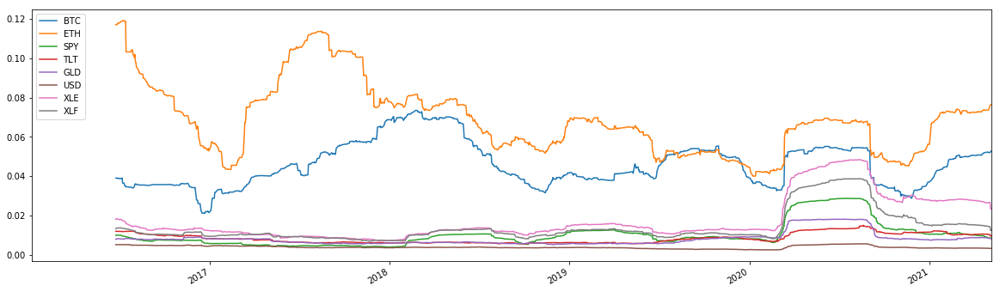

In [20]:
# Calculate the rolling standard deviation for all portfolios using a 21-day window
roll = portfolio_returns.rolling(window=120).std()
# Plot the rolling standard deviation
portfolio_returns.rolling(window=120).std().plot(figsize=(20,6))

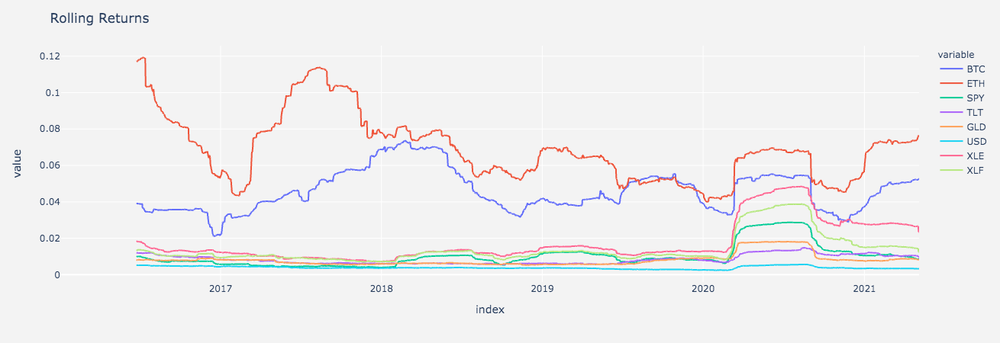

In [21]:
roll_120_fig = px.line(roll)
roll_120_fig.update_layout(
    title='Rolling Returns',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
roll_120_fig.show()

In [22]:
# Calculate the correlation
price_correlation = portfolio_returns.corr()
# Display de correlation matrix
price_correlation

,BTC,ETH,SPY,TLT,GLD,USD,XLE,XLF
BTC,1.000000,0.519841,0.151997,0.115408,-0.038046,-0.024193,0.124296,0.142190
ETH,0.519841,1.000000,0.134332,0.105430,-0.017121,-0.045281,0.102589,0.113738
SPY,0.151997,0.134332,1.000000,-0.006043,-0.389974,-0.026650,0.713741,0.862439
TLT,0.115408,0.105430,-0.006043,1.000000,0.332616,-0.450105,-0.023653,-0.142062
GLD,-0.038046,-0.017121,-0.389974,0.332616,1.000000,-0.143608,-0.337888,-0.497931
USD,-0.024193,-0.045281,-0.026650,-0.450105,-0.143608,1.000000,-0.051125,0.017659
XLE,0.124296,0.102589,0.713741,-0.023653,-0.337888,-0.051125,1.000000,0.765009
XLF,0.142190,0.113738,0.862439,-0.142062,-0.497931,0.017659,0.765009,1.000000


In [49]:
# Use `ewm` to calculate the rolling window
ewm_calc = portfolio_returns.ewm(halflife=120).std()

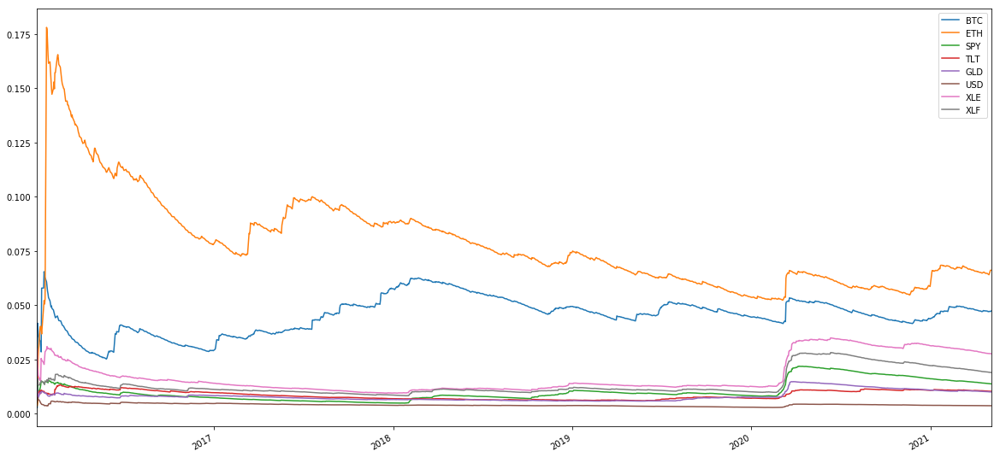

In [50]:
portfolio_returns.ewm(halflife=120).std().plot(figsize=(20, 10))

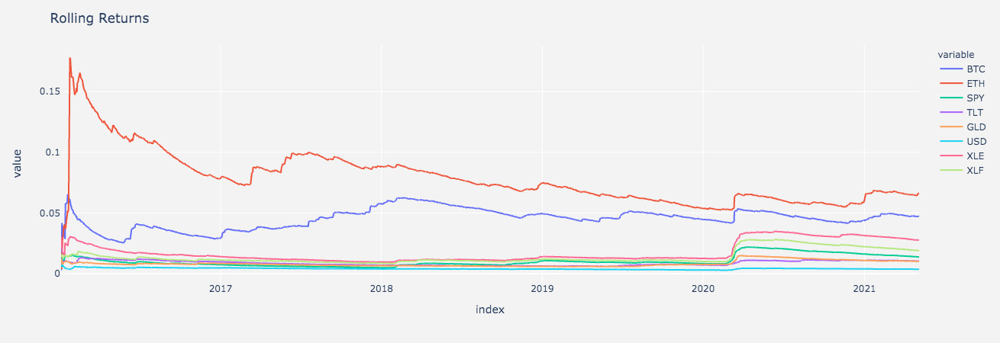

In [52]:
roll_120_line_fig = px.line(ewm_calc)
roll_120_line_fig.update_layout(
    title='Rolling Returns',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
roll_120_line_fig.show()

In [26]:
# Annualized Sharpe Ratios
sharpe_ratios = (portfolio_returns.mean() * 252) / (portfolio_returns.std() * np.sqrt(252))
sharpe_ratios['BTC']


1.6089747589618075

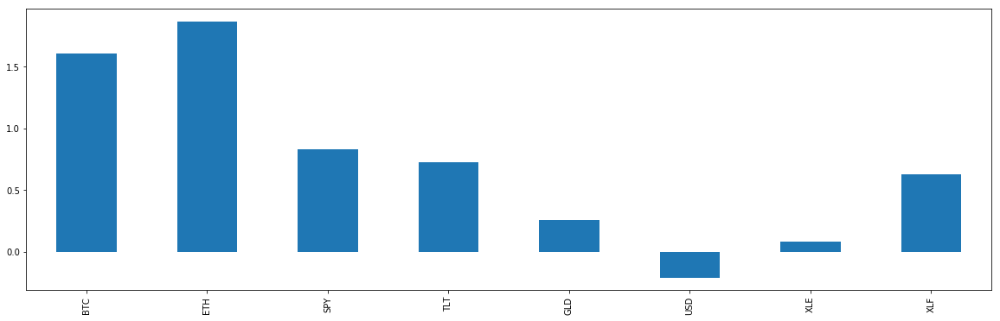

In [27]:
# Visualize the sharpe ratios as a bar plot
sharpe_ratios.plot(kind='bar',figsize=(20,6))

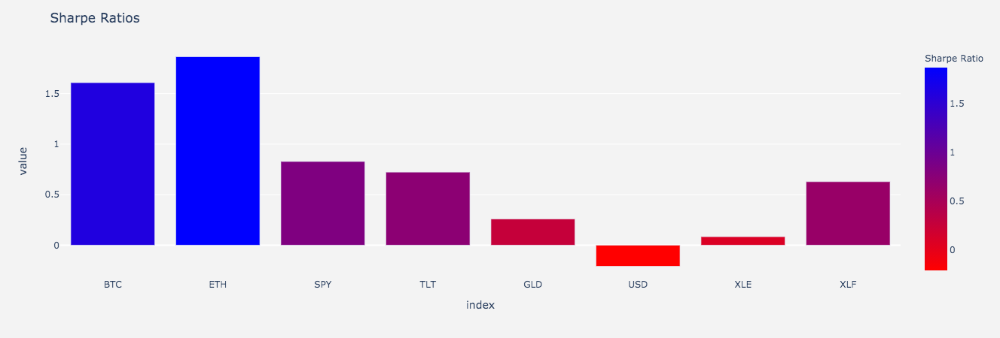

In [28]:
sharpe_bar_fig = px.bar(sharpe_ratios,labels=dict(x="Assets", y="Sharpe Ratio", color="Sharpe Ratio"),color = sharpe_ratios, color_continuous_scale='Bluered_r')
sharpe_bar_fig.update_layout(
    title='Sharpe Ratios',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
sharpe_bar_fig.show()

In [29]:
# Calculate and plot the correlation
price_correlation_new = portfolio_returns.corr()
# Display de correlation matrix
price_correlation_new

,BTC,ETH,SPY,TLT,GLD,USD,XLE,XLF
BTC,1.000000,0.519841,0.151997,0.115408,-0.038046,-0.024193,0.124296,0.142190
ETH,0.519841,1.000000,0.134332,0.105430,-0.017121,-0.045281,0.102589,0.113738
SPY,0.151997,0.134332,1.000000,-0.006043,-0.389974,-0.026650,0.713741,0.862439
TLT,0.115408,0.105430,-0.006043,1.000000,0.332616,-0.450105,-0.023653,-0.142062
GLD,-0.038046,-0.017121,-0.389974,0.332616,1.000000,-0.143608,-0.337888,-0.497931
USD,-0.024193,-0.045281,-0.026650,-0.450105,-0.143608,1.000000,-0.051125,0.017659
XLE,0.124296,0.102589,0.713741,-0.023653,-0.337888,-0.051125,1.000000,0.765009
XLF,0.142190,0.113738,0.862439,-0.142062,-0.497931,0.017659,0.765009,1.000000


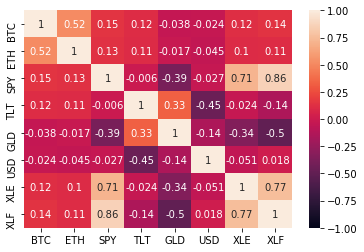

In [30]:
sns.heatmap(price_correlation_new, vmin=-1, vmax=1,annot=True)

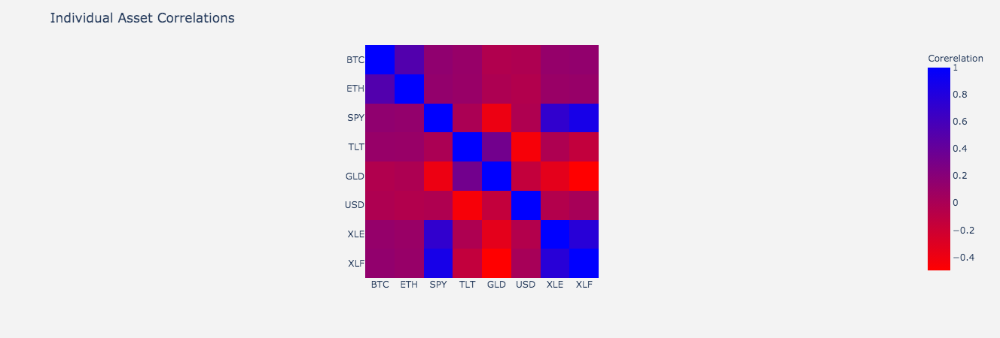

In [53]:
heatmap_fig = px.imshow(price_correlation_new, color_continuous_scale='Bluered_r', labels = dict(color='Corerelation'))
heatmap_fig.update_layout(
    title='Individual Asset Correlations',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
heatmap_fig.show()

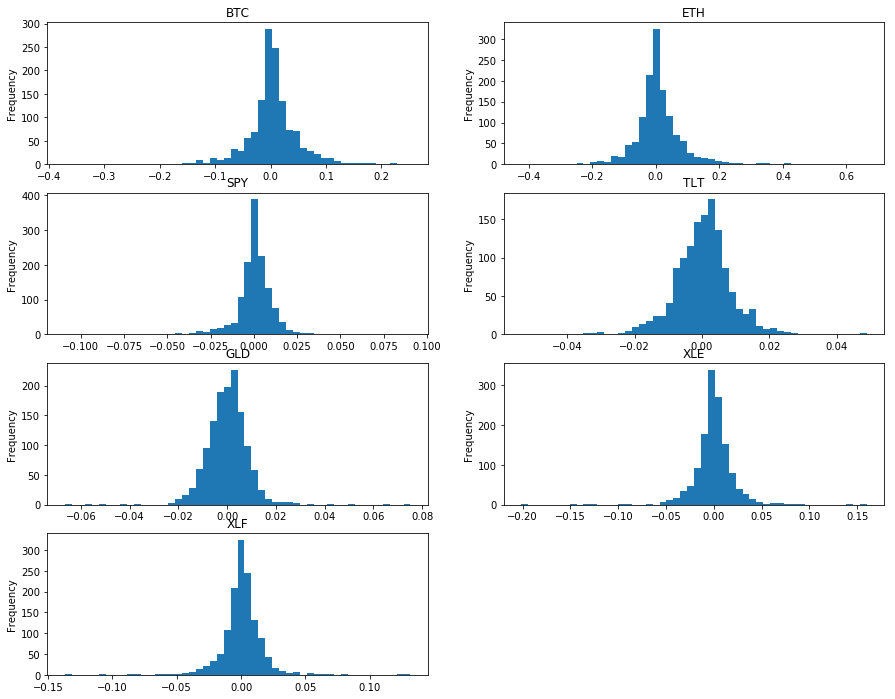

In [32]:
# Distribution Histogram

portfolio_returns.plot.hist(stacked=True, bins=100)

plt.subplot(4, 2, 1)
portfolio_returns['BTC'].plot.hist(bins = 50,figsize=(15,12))
plt.title('BTC')

  
plt.subplot(4, 2, 2)
portfolio_returns['ETH'].plot.hist(bins = 50)
plt.title('ETH')
  
plt.subplot(4, 2, 3)
portfolio_returns['SPY'].plot.hist(bins = 50)
plt.title('SPY')

plt.subplot(4, 2, 4)
portfolio_returns['TLT'].plot.hist(bins = 50)
plt.title('TLT')

plt.subplot(4, 2, 5)
portfolio_returns['GLD'].plot.hist(bins = 50)
plt.title('GLD')

plt.subplot(4, 2, 6)
portfolio_returns['XLE'].plot.hist(bins = 50)
plt.title('XLE')

plt.subplot(4, 2, 7)
portfolio_returns['XLF'].plot.hist(bins = 50)
plt.title('XLF')

  
plt.show()



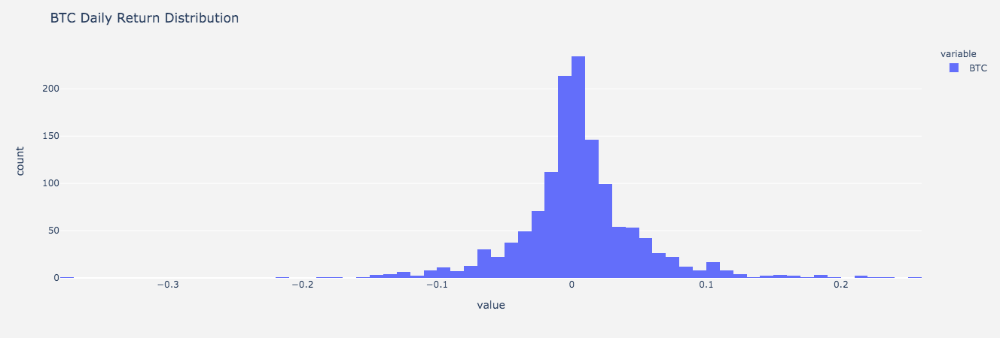

In [33]:
histogram_fig = px.histogram(portfolio_returns['BTC'])
histogram_fig.update_layout(
    title='BTC Daily Return Distribution',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True,
    barmode = 'stack'
)
histogram_fig.show()

In [34]:
# Set weights
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

weights = [0,0,0.5,0.4,0.05,0.05,0,0]

# Calculate portfolio return

traditional_portfolio = portfolio_returns.dot(weights)
# portfolio_returns_new.set_index('Date')

traditional_portfolio.dropna()

# Display sample data
traditional_portfolio.head()

2016-01-05    0.002039
2016-01-06    0.000032
2016-01-07   -0.006734
2016-01-08   -0.006873
2016-01-11   -0.003514
dtype: float64

In [35]:
# Set weights
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

weights = [0.1,0,0.5,0.4,0.0,0.0,0,0]

# Calculate portfolio return

btc_portfolio = portfolio_returns.dot(weights)
# portfolio_returns_new.set_index('Date')

btc_portfolio.dropna()

# Display sample data
traditional_portfolio.head()

2016-01-05    0.002039
2016-01-06    0.000032
2016-01-07   -0.006734
2016-01-08   -0.006873
2016-01-11   -0.003514
dtype: float64

In [65]:
# Set weights
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

weights = [0.00,0.20,0.40,0.40,0.00,0.00,0.00,0.00]

# Calculate portfolio return

eth_portfolio = portfolio_returns.dot(weights)
# portfolio_returns_new.set_index('Date')

eth_portfolio.dropna()

# Display sample data
eth_portfolio.head()

2016-01-05    0.000902
2016-01-06    0.000875
2016-01-07   -0.005803
2016-01-08    0.003347
2016-01-11    0.012001
dtype: float64

In [37]:
# Set weights
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

weights = [0.05,0.05,0.50,0.40,0.00,0.00,0.00,0.00]

# Calculate portfolio return

crypto_portfolio = portfolio_returns.dot(weights)
# portfolio_returns_new.set_index('Date')

crypto_portfolio.dropna()

# Display sample data
crypto_portfolio.head()

2016-01-05    0.001617
2016-01-06   -0.000825
2016-01-07   -0.003433
2016-01-08   -0.005408
2016-01-11    0.000198
dtype: float64

In [66]:
# Create daily returns of all portfolios
column = ['Traditional', 'Traditional + BTC', 'Traditional + ETH', 'Traditional + Crypto']

combined_returns = pd.concat([traditional_portfolio, btc_portfolio, eth_portfolio, crypto_portfolio], axis="columns", join="inner")
combined_returns.columns = column
combined_returns.head()

,Traditional,Traditional + BTC,Traditional + ETH,Traditional + Crypto
2016-01-05,0.002039,0.001712,0.000902,0.001617
2016-01-06,0.000032,-0.001192,0.000875,-0.000825
2016-01-07,-0.006734,0.000405,-0.005803,-0.003433
2016-01-08,-0.006873,-0.008311,0.003347,-0.005408
2016-01-11,-0.003514,-0.004122,0.012001,0.000198


In [67]:
# Calculate cumulative returns of all portfolios
traditional_cum = (1 + traditional_portfolio).cumprod()
btc_cum = (1 + btc_portfolio).cumprod()
eth_cum = (1 + eth_portfolio).cumprod()
crypto_cum = (1 + crypto_portfolio).cumprod()

column = ['Traditional', 'Traditional + BTC', 'Traditional + ETH', 'Traditional + Crypto']

combined_portfolios = pd.concat([traditional_cum, btc_cum, eth_cum, crypto_cum], axis="columns", join="inner")
combined_portfolios.columns = column
combined_portfolios.head()

,Traditional,Traditional + BTC,Traditional + ETH,Traditional + Crypto
2016-01-05,1.002039,1.001712,1.000902,1.001617
2016-01-06,1.002072,1.000518,1.001778,1.000790
2016-01-07,0.995324,1.000923,0.995964,0.997355
2016-01-08,0.988483,0.992605,0.999297,0.991961
2016-01-11,0.985010,0.988513,1.011289,0.992157


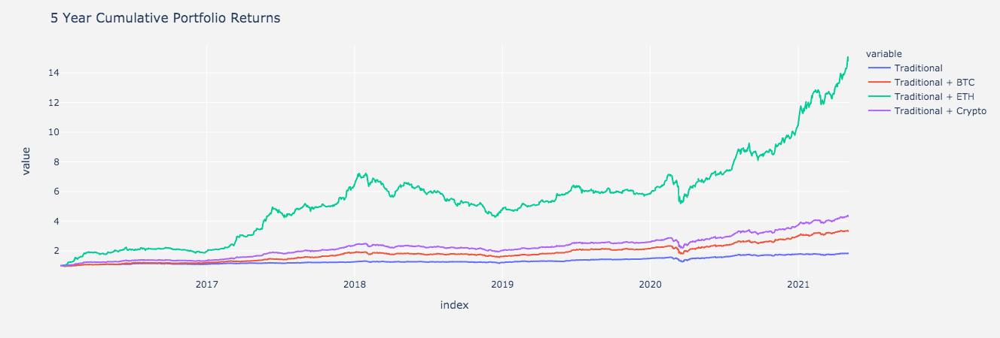

In [68]:
# Plot cumulative returns
# cumulative_returns.plot(figsize=(20,10), title="Cumulative Portfolio Returns")

cum_returns = px.line(combined_portfolios)
cum_returns.update_layout(
    title='5 Year Cumulative Portfolio Returns',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
cum_returns.show()

In [69]:
portfolio_sharpe_ratios = (combined_returns.mean() * 252) / (combined_returns.std() * np.sqrt(252))
portfolio_sharpe_ratios

Traditional             1.113680
Traditional + BTC       1.665065
Traditional + ETH       2.023656
Traditional + Crypto    1.916422
dtype: float64

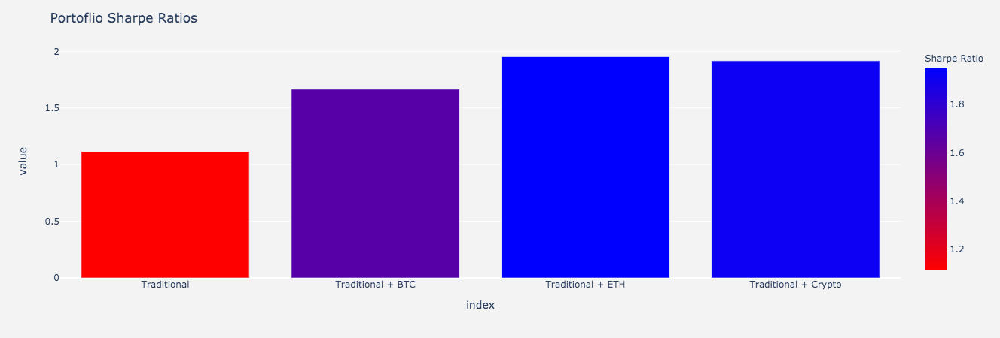

In [64]:
portfolio_sharpe_fig = px.bar(portfolio_sharpe_ratios,labels=dict(x="Assets", y="Sharpe Ratio", color="Sharpe Ratio"),color = portfolio_sharpe_ratios, color_continuous_scale='Bluered_r')
portfolio_sharpe_fig.update_layout(
    title='Portoflio Sharpe Ratios',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
portfolio_sharpe_fig.show()

In [80]:
vol_row = pn.Row(port_returns_fig,volatility_fig,vol_box_fig)

In [81]:
roll_row = pn.Row(roll_120_fig,roll_120_line_fig)

In [82]:
sharpe_row = pn.Row(histogram_fig,sharpe_bar_fig)

In [83]:
heatmap_row = pn.Row(heatmap_fig)

In [84]:
vol_column = pn.Column(
    '# At a Glance - Volatility of Assets',
    vol_row

)
vol_column

Column
    [0] Markdown(str)
    [1] Row
        [0] Plotly(Figure)
        [1] Plotly(Figure)
        [2] Plotly(Figure)

In [85]:
roll_column = pn.Column(
    '# At a Glance - Rolling 21 Day Average of Assets',
    roll_row

)
roll_column

Column
    [0] Markdown(str)
    [1] Row
        [0] Plotly(Figure)
        [1] Plotly(Figure)

In [86]:
sharpe_column = pn.Column(
    '# At a Glance - Sharpe Ratios of Each Asset',
    sharpe_row

)
sharpe_row

Row
    [0] Plotly(Figure)
    [1] Plotly(Figure)

In [87]:
heat_column = pn.Column(
    '# Heatmap Correlations Related to Each Asset',
    heatmap_row
    
)
heatmap_row

Row
    [0] Plotly(Figure)

In [88]:
tabs = pn.Tabs(
    ("Volatility",vol_column),
    ("Rolling Averages",roll_column),
    ("Sharpe Ratios",sharpe_column),
    ("Heatmap",heat_column)
)

tabs

Tabs
    [0] Column
        [0] Markdown(str)
        [1] Row
            [0] Plotly(Figure, relayout_data={'autosize': True}, viewport={'xaxis.range': ['2016-01-...})
            [1] Plotly(Figure, relayout_data={'autosize': True}, viewport={'xaxis.range': ['2016-01-...})
            [2] Plotly(Figure, relayout_data={'autosize': True}, viewport={'xaxis.range': [-0.5, ...})
    [1] Column
        [0] Markdown(str)
        [1] Row
            [0] Plotly(Figure, relayout_data={'autosize': True}, viewport={'xaxis.range': ['2016-01-...})
            [1] Plotly(Figure, relayout_data={'autosize': True}, viewport={'xaxis.range': ['2016-01-...})
    [2] Column
        [0] Markdown(str)
        [1] Row
            [0] Plotly(Figure, relayout_data={'autosize': True}, viewport={'xaxis.range': [-0.38, ...})
            [1] Plotly(Figure, relayout_data={'autosize': True}, viewport={'xaxis.range': [-0.5, ...})
    [3] Column
        [0] Markdown(str)
        [1] Row
            [0] Plotly(Figure, relayout_data={'autosize': True}, viewport={'xaxis.range': [-0.5, ...})

In [ ]:
tabs.show()